# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from collections import Counter
from sklearn.metrics import accuracy_score
from sklearn import model_selection as cross_validation
import warnings
warnings.filterwarnings("ignore")

In [2]:
# using SQLite Table to read data.
con = sqlite3.connect('amazon-fine-food-reviews/database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 20000""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (20000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [3]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [4]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [5]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [6]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [7]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [8]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [9]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(19354, 10)

In [10]:
#Checking to see how much % of data still remains

(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

96.77

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [11]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [12]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [13]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(19354, 10)


1    16339
0     3015
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [14]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

#sent_4900 = final['Text'].values[4900]
#print(sent_4900)
#print("="*50)

We have used the Victor fly bait for 3 seasons.  Can't beat it.  Great product!
I received this box with great anticipation since they don't sell these on the west coast. I got the package, opened the box and was EXTREMELY disappointed. The cookies looked like a gorilla shook the box to death and left most of the box filled with crumbs. AND THERE WAS A RODENT SIZED HOLE ON THE SIDE OF THE BOX!!!!!!!! So, needless to say I will not NOT be reordering these again.
I have two cats. My big boy has eaten these and never had a problem...as a matter of fact he has never vomited or had a hair ball since I adopted him at 2 months. My girl cat throws up every time she eats this particular flavor. Since I treat them equally these are no longer purchased. I hate to see my girl sick so I just recommend you watch your cats after you give them these treats. If not a problem...carry on.


In [15]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
#sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

We have used the Victor fly bait for 3 seasons.  Can't beat it.  Great product!


In [16]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

#soup = BeautifulSoup(sent_4900, 'lxml')
#text = soup.get_text()
#print(text)

We have used the Victor fly bait for 3 seasons.  Can't beat it.  Great product!
I received this box with great anticipation since they don't sell these on the west coast. I got the package, opened the box and was EXTREMELY disappointed. The cookies looked like a gorilla shook the box to death and left most of the box filled with crumbs. AND THERE WAS A RODENT SIZED HOLE ON THE SIDE OF THE BOX!!!!!!!! So, needless to say I will not NOT be reordering these again.
I have two cats. My big boy has eaten these and never had a problem...as a matter of fact he has never vomited or had a hair ball since I adopted him at 2 months. My girl cat throws up every time she eats this particular flavor. Since I treat them equally these are no longer purchased. I hate to see my girl sick so I just recommend you watch your cats after you give them these treats. If not a problem...carry on.


In [17]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [18]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

I have two cats. My big boy has eaten these and never had a problem...as a matter of fact he has never vomited or had a hair ball since I adopted him at 2 months. My girl cat throws up every time she eats this particular flavor. Since I treat them equally these are no longer purchased. I hate to see my girl sick so I just recommend you watch your cats after you give them these treats. If not a problem...carry on.


In [19]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

We have used the Victor fly bait for  seasons.  Can't beat it.  Great product!


In [20]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

I have two cats My big boy has eaten these and never had a problem as a matter of fact he has never vomited or had a hair ball since I adopted him at 2 months My girl cat throws up every time she eats this particular flavor Since I treat them equally these are no longer purchased I hate to see my girl sick so I just recommend you watch your cats after you give them these treats If not a problem carry on 


In [21]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [22]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████| 19354/19354 [00:07<00:00, 2708.93it/s]


In [23]:
preprocessed_reviews[1500]

'two cats big boy eaten never problem matter fact never vomited hair ball since adopted months girl cat throws every time eats particular flavor since treat equally no longer purchased hate see girl sick recommend watch cats give treats not problem carry'

<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

In [24]:
## Similartly you can do preprocessing for review summary also.
len(preprocessed_reviews)

19354

# [4] Featurization

## [4.1] BAG OF WORDS

In [25]:

labels = final.head(20000)['Score']
# split the train data set into cross validation train and cross validation test

X_1_bow, X_test_bow, y_1_bow, y_test_bow = cross_validation.train_test_split(preprocessed_reviews[:20000],labels, test_size=0.3, random_state=0)
X_tr_bow, X_cv_bow, y_tr_bow, y_cv_bow = cross_validation.train_test_split(X_1_bow, y_1_bow, test_size=0.3)
count_vect = CountVectorizer(min_df=10) #in scikit-learn
#count_vect.fit(preprocessed_reviews)
X_tr_bow = count_vect.fit_transform(X_tr_bow)
X_cv_bow = count_vect.transform(X_cv_bow)
X_test_bow =count_vect.transform(X_test_bow)
X_1_bow = count_vect.transform(X_1_bow)
print("some feature names ", count_vect.get_feature_names()[:10])


some feature names  ['ability', 'able', 'absolute', 'absolutely', 'absorbed', 'acceptable', 'accident', 'accidentally', 'according', 'account']


In [26]:
labels.value_counts()

1    16339
0     3015
Name: Score, dtype: int64

<h3>Balancing the Dataset<h3>

In [27]:
from imblearn.under_sampling import RandomUnderSampler

from collections import Counter

sm = RandomUnderSampler(random_state=42)
X_res, y_res = sm.fit_resample(X_tr_bow,y_tr_bow)
print('Resampled dataset shape %s' % Counter(y_res))


Resampled dataset shape Counter({0: 1498, 1: 1498})


## [4.2] Bi-Grams and n-Grams.

In [28]:
#bi-gram, tri-gram and n-gram

#removing stop words like "not" should be avoided before building n-grams
# count_vect = CountVectorizer(ngram_range=(1,2))
# please do read the CountVectorizer documentation http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.CountVectorizer.html

# you can choose these numebrs min_df=10, max_features=5000, of your choice
count_vect_ngrams = CountVectorizer(ngram_range=(1,2), min_df=10)
final_bigram_counts = count_vect_ngrams.fit_transform(preprocessed_reviews)
print("the type of count vectorizer ",type(final_bigram_counts))
print("the shape of out text BOW vectorizer ",final_bigram_counts.get_shape())
print("the number of unique words including both unigrams and bigrams ", final_bigram_counts.get_shape()[1])

the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (19354, 11762)
the number of unique words including both unigrams and bigrams  11762


## [4.3] TF-IDF

In [29]:
# split the train data set into cross validation train and cross validation test

X_1_tfidv, X_test_tfidv, y_1_tfidv, y_test_tfidv = cross_validation.train_test_split(preprocessed_reviews[:20000],labels, test_size=0.3, random_state=0)
X_tr_tfidv, X_cv_tfidv, y_tr_tfidv, y_cv_tfidv = cross_validation.train_test_split(X_1_tfidv, y_1_tfidv, test_size=0.3)
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2), min_df=10)
#tf_idf_vect.fit(preprocessed_reviews)
X_tr_tfidv = tf_idf_vect.fit_transform(X_tr_tfidv)
X_cv_tfidv = tf_idf_vect.transform(X_cv_tfidv)
X_test_tfidv =tf_idf_vect.transform(X_test_tfidv)
X_1_tfidv = tf_idf_vect.transform(X_1_tfidv)


print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])


some sample features(unique words in the corpus) ['ability', 'able', 'able buy', 'able eat', 'able find', 'able get', 'able order', 'absolute', 'absolute best', 'absolute favorite']


In [30]:
from imblearn.under_sampling import RandomUnderSampler

from collections import Counter

sm = RandomUnderSampler(random_state=42)
X_res_tr, y_res = sm.fit_resample(X_tr_tfidv,y_tr_tfidv)
print('Resampled dataset shape %s' % Counter(y_res))
X_res_cv, y_res_cv = sm.fit_resample(X_cv_tfidv,y_cv_tfidv)
print('Resampled dataset shape %s' % Counter(y_res_cv))
X_res_1, y_res_1 = sm.fit_resample(X_1_tfidv,y_1_tfidv)
print('Resampled dataset shape %s' % Counter(y_res_1))


Resampled dataset shape Counter({0: 1493, 1: 1493})
Resampled dataset shape Counter({0: 623, 1: 623})
Resampled dataset shape Counter({0: 2116, 1: 2116})


## [4.4] Word2Vec

In [31]:
# Train your own Word2Vec model using your own text corpus
X_1_w2v, X_test_w2v, y_1_w2v, y_test_w2v = cross_validation.train_test_split(preprocessed_reviews[:20000],labels, test_size=0.3, random_state=0)
X_tr_w2v, X_cv_w2v, y_tr_w2v, y_cv_w2v = cross_validation.train_test_split(X_1_w2v, y_1_w2v, test_size=0.3)

i=0
list_of_sentance=[]
for sentance in X_tr_w2v:
    list_of_sentance.append(sentance.split())

In [32]:
# Using Google News Word2Vectors

is_your_ram_gt_16g=False
want_to_use_google_w2v = False
want_to_train_w2v = True

if want_to_train_w2v:
    # min_count = 5 considers only words that occured atleast 8 times
    w2v_model=Word2Vec(list_of_sentance,min_count=8,size=50, workers=4)
    print(w2v_model.wv.most_similar('great'))
    print('='*50)
    #print(w2v_model.wv.most_similar('worst'))
    
elif want_to_use_google_w2v and is_your_ram_gt_16g:
    if os.path.isfile('GoogleNews-vectors-negative300.bin'):
        w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
        print(w2v_model.wv.most_similar('great'))
        print(w2v_model.wv.most_similar('worst'))
    else:
        print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

[('good', 0.8548399209976196), ('excellent', 0.8312476277351379), ('amazing', 0.7927986979484558), ('overall', 0.7874646186828613), ('quick', 0.7702838182449341), ('especially', 0.7659739851951599), ('well', 0.765559732913971), ('value', 0.764397919178009), ('looking', 0.7535039782524109), ('quality', 0.7531806230545044)]


In [33]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 8 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 8 times  4335
sample words  ['thing', 'keeping', 'product', 'five', 'stars', 'broken', 'shells', 'top', 'bag', 'found', 'number', 'half', 'however', 'got', 'bottom', 'realized', 'many', 'seeds', 'shell', 'seasoning', 'salt', 'blow', 'may', 'lose', 'well', 'otherwise', 'great', 'eating', 'experience', 'wonderful', 'price', 'tasting', 'size', 'big', 'enough', 'not', 'bulk', 'also', 'appreciate', 'ship', 'quite', 'often', 'macadamia', 'nuts', 'salted', 'instead', 'raw', 'natural', 'nothing', 'added']


## [4.4.1] Converting text into vectors using Avg W2V, TFIDF-W2V

#### [4.4.1.1] Avg W2v

In [34]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors_tr = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_tr.append(sent_vec)
print(len(sent_vectors_tr))
print(len(sent_vectors_tr[0]))

100%|██████████| 9482/9482 [00:10<00:00, 904.81it/s]

9482
50


In [35]:
# compute average word2vec for each review.
list_of_sentance=[]
for sentance in X_test_w2v:
    list_of_sentance.append(sentance.split())
sent_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_test.append(sent_vec)
print(len(sent_vectors_test))
print(len(sent_vectors_test[0]))

100%|██████████| 5807/5807 [00:06<00:00, 896.41it/s]

5807
50


In [36]:
# compute average word2vec for each review.
list_of_sentance=[]
for sentance in X_cv_w2v:
    list_of_sentance.append(sentance.split())
sent_vectors_cv = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_cv.append(sent_vec)
print(len(sent_vectors_cv))
print(len(sent_vectors_cv[0]))

100%|██████████| 4065/4065 [00:04<00:00, 889.58it/s]

4065
50


In [37]:
# compute average word2vec for each review.
list_of_sentance=[]
for sentance in X_1_w2v:
    list_of_sentance.append(sentance.split())
sent_vectors_1 = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors_1.append(sent_vec)
print(len(sent_vectors_1))
print(len(sent_vectors_1[0]))

100%|██████████| 13547/13547 [00:15<00:00, 897.46it/s]

13547
50


#### [4.4.1.2] TFIDF weighted W2v

In [38]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
model = TfidfVectorizer()

tf_idf_matrix = model.fit_transform(X_tr_w2v)

# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
tfidf_feat = model.get_feature_names()

In [39]:
# TF-IDF weighted Word2Vec
 # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_1 = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
list_of_sentance=[]
for sentance in X_1_w2v:
    list_of_sentance.append(sentance.split())
for sent in tqdm(list_of_sentance): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_1.append(sent_vec)
    row += 1

100%|██████████| 13547/13547 [01:50<00:00, 122.32it/s]


In [40]:
# TF-IDF weighted Word2Vec
 # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_test = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
list_of_sentance=[]
for sentance in X_test_w2v:
    list_of_sentance.append(sentance.split())
for sent in tqdm(list_of_sentance): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_test.append(sent_vec)
    row += 1

100%|██████████| 5807/5807 [00:46<00:00, 124.03it/s]


In [41]:
# TF-IDF weighted Word2Vec
 # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_cv = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
list_of_sentance=[]
for sentance in X_cv_w2v:
    list_of_sentance.append(sentance.split())
for sent in tqdm(list_of_sentance): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_cv.append(sent_vec)
    row += 1

100%|██████████| 4065/4065 [00:35<00:00, 114.73it/s]


In [42]:
# TF-IDF weighted Word2Vec
 # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_tr = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
list_of_sentance=[]
for sentance in X_tr_w2v:
    list_of_sentance.append(sentance.split())
for sent in tqdm(list_of_sentance): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_tr.append(sent_vec)
    row += 1

100%|██████████| 9482/9482 [01:29<00:00, 106.20it/s]


# [5] Assignment 10: K-Means, Agglomerative & DBSCAN Clustering

<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

<h4><font color='red'>Note: Data Leakage</font></h4>

1. There will be an issue of data-leakage if you vectorize the entire data and then split it into train/cv/test.
2. To avoid the issue of data-leakag, make sure to split your data first and then vectorize it. 
3. While vectorizing your data, apply the method fit_transform() on you train data, and apply the method transform() on cv/test data.
4. For more details please go through this <a href='https://soundcloud.com/applied-ai-course/leakage-bow-and-tfidf'>link.</a>

## [5.1] K-Means Clustering

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split , cross_val_score
from sklearn.metrics import accuracy_score
from collections import Counter
from sklearn import model_selection as cross_validation
import warnings
warnings.filterwarnings("ignore")
from sklearn.metrics import f1_score
import scikitplot as skplt
from tqdm import tqdm
from sklearn.calibration import CalibratedClassifierCV
from sklearn import linear_model
from sklearn.cluster import KMeans
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score 
from wordcloud import WordCloud 

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [26]:
count_vect = CountVectorizer(min_df=10) #in scikit-learn
#count_vect.fit(preprocessed_reviews)
X_bow = count_vect.fit_transform(preprocessed_reviews[:10000])

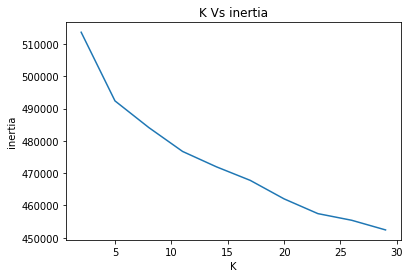

Best value of K is : 29


In [27]:
     

x =[]
y =[]
z =[]

for i in range(2,30,3):
    clf = KMeans(n_clusters=i,n_jobs=-1)
    
    # fitting the model on crossvalidation train
    clf.fit(X_bow)
    
    acc = clf.inertia_
   
    x.append(i)
    y.append(acc)
   



plt.plot(x,y)

plt.xlabel("K")
plt.ylabel("inertia")

plt.title("K Vs inertia")
plt.show()
best = y.index(min(y))
print("Best value of K is :",x[best])



In [44]:
clf = KMeans(n_clusters=2,n_jobs=-1)
clf.fit(X_1_bow)
silhouette_score(X_1_bow,clf.labels_)
#The best value is 1 and the worst value is -1. 

#Silhouette Score for BOW using KMeans

0.31388979258569505

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [45]:
s0 = ""
s1 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in count_vect.inverse_transform(X_1_bow[c]):
            for k in j:
                if k in s0:
                    pass
                else:
                    s0+=k
                    s0+=" "
        c+=1
    else:
        for j in count_vect.inverse_transform(X_1_bow[c]):
            for k in j:
                if k in s1:
                    pass
                else:
                    s1+=k
                    s1+=" "
        c+=1
   

In [46]:
from wordcloud import WordCloud 
import matplotlib.pyplot as plt 

#Cluster of words for positive rating(1)  
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  



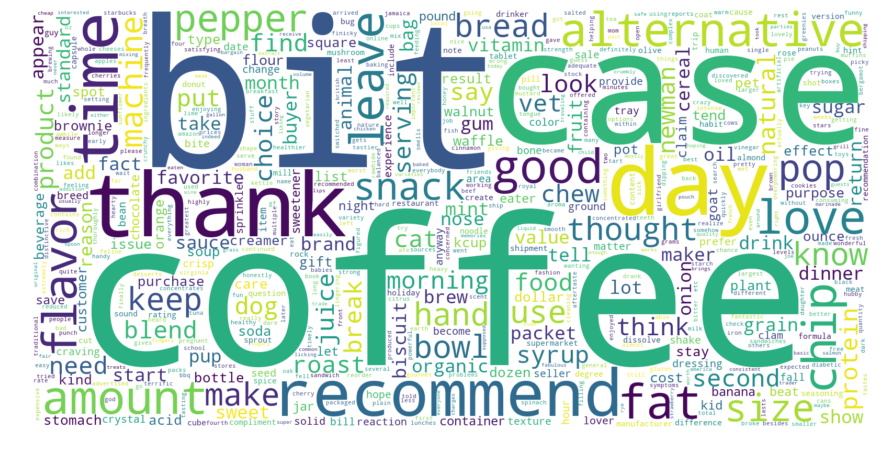

In [47]:
# plot the WordCloud image  

plt.figure(figsize=(15,15))
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 

plt.margins(x=0, y=0) 
plt.show() 

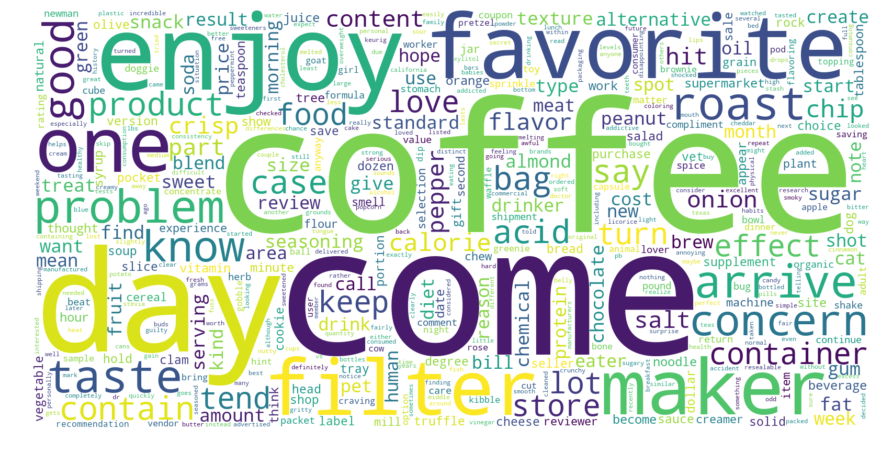

In [48]:

#Cluster of words for negative rating(0)
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

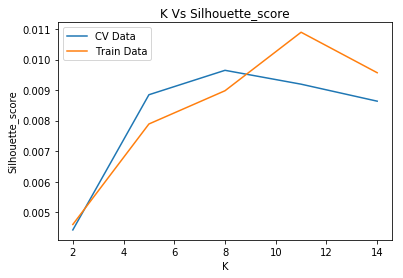

Best value of K is : 8


In [56]:

x =[]
y =[]
z =[]
w =[]
for i in range(2,15,3):
    clf = KMeans(n_clusters=i,n_jobs=-1)
    
    # fitting the model on crossvalidation train
    a = clf.fit(X_tr_tfidv)
    #p1 = clf.predict(X_tr_bow)
    acc2 = silhouette_score(X_tr_tfidv,clf.labels_)
    clf = KMeans(n_clusters=i,n_jobs=-1)
    b = clf.fit(X_cv_tfidv)
    #clf.predict(X_cv_bow)
    # evaluate CV accuracy
    acc = silhouette_score(X_cv_tfidv,clf.labels_)
   
    x.append(i)
    y.append(acc)
    z.append(acc2)



plt.plot(x, y, label='CV Data')
plt.plot(x, z, label='Train Data')
plt.legend()
plt.xlabel("K")
plt.ylabel("Silhouette_score")

plt.title("K Vs Silhouette_score")
plt.show()
best = y.index(max(y))
print("Best value of K is :",x[best])



In [57]:
clf = KMeans(n_clusters=8,n_jobs=-1)
clf.fit(X_1_tfidv)
silhouette_score(X_1_tfidv,clf.labels_)
#The best value is 1 and the worst value is -1. 

#Silhouette Score for TFIDF using KMeans


0.010301484032499923

In [58]:
d=[]
for s in clf.labels_:
    if s not in d:
        d.append(s)
print(d)

[7, 1, 3, 4, 5, 0, 2, 6]


### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

In [59]:
s0 = ""
s1 = ""
s2 = ""
s3 = ""
s4 = ""
s5 = ""
s6 = ""
s7 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s0:
                    pass
                else:
                    s0+=k
                    s0+=" "
        c+=1
    elif i==1:
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s1:
                    pass
                else:
                    s1+=k
                    s1+=" "
        c+=1
    elif i==2:
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s2:
                    pass
                else:
                    s2+=k
                    s2+=" "
        c+=1
    elif i==3:
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s3:
                    pass
                else:
                    s3+=k
                    s3+=" "
        c+=1
    elif i==4:
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s4:
                    pass
                else:
                    s4+=k
                    s4+=" "
        c+=1
    elif i==5:
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s5:
                    pass
                else:
                    s5+=k
                    s5+=" "
        c+=1
    elif i==6:
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s6:
                    pass
                else:
                    s6+=k
                    s6+=" "
        c+=1
    elif i==7:
        for j in tf_idf_vect.inverse_transform(X_1_tfidv[c]):
            for k in j:
                if k in s7:
                    pass
                else:
                    s7+=k
                    s7+=" "
        c+=1

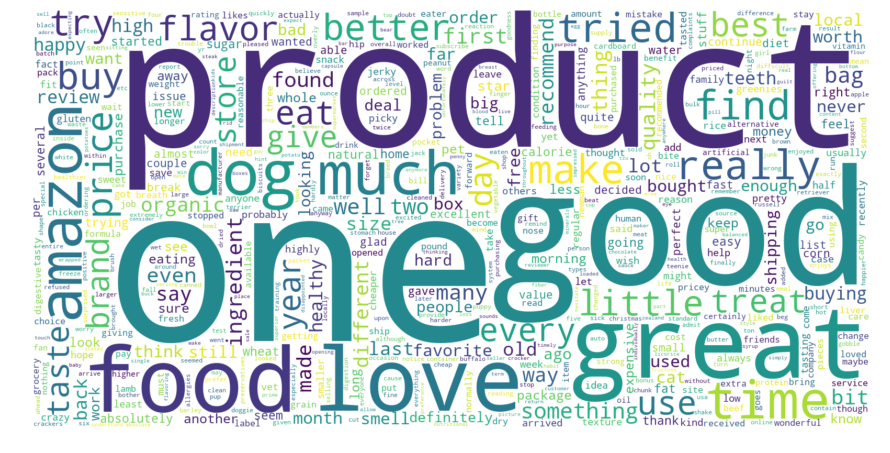

In [60]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


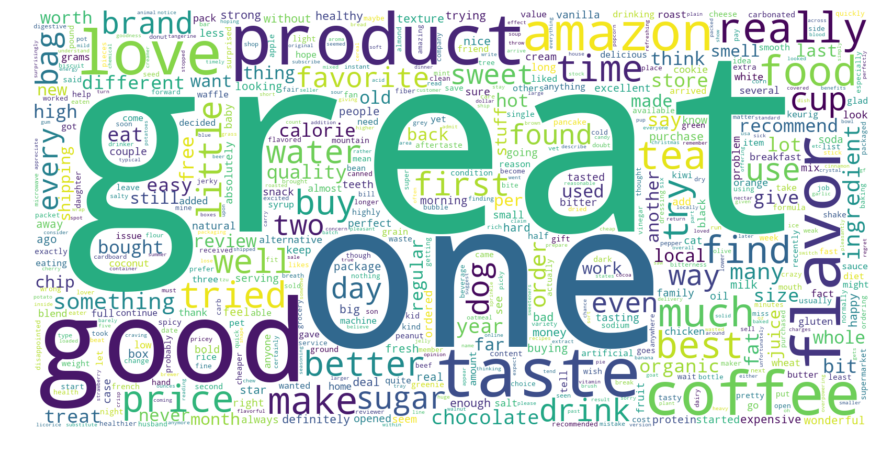

In [61]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


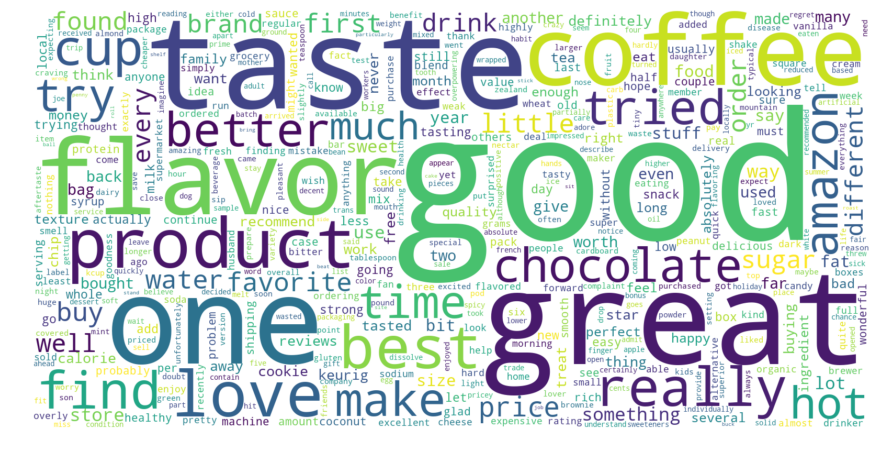

In [62]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s2) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


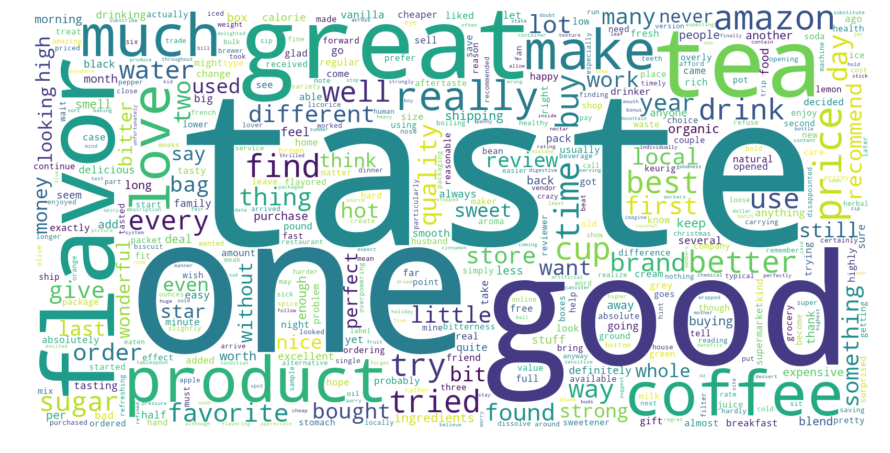

In [63]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s3) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


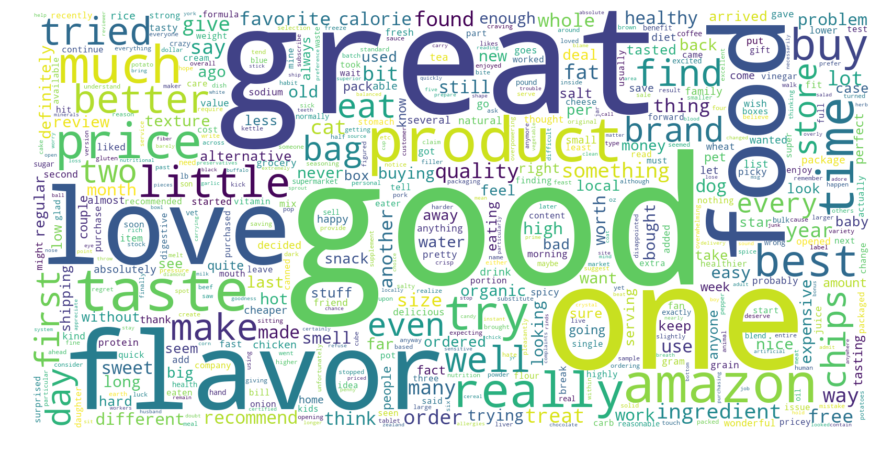

In [64]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s4) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


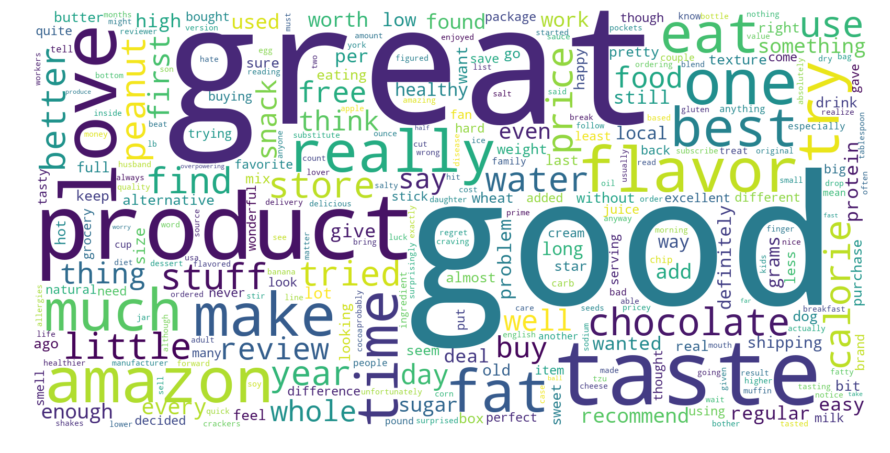

In [65]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s5) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


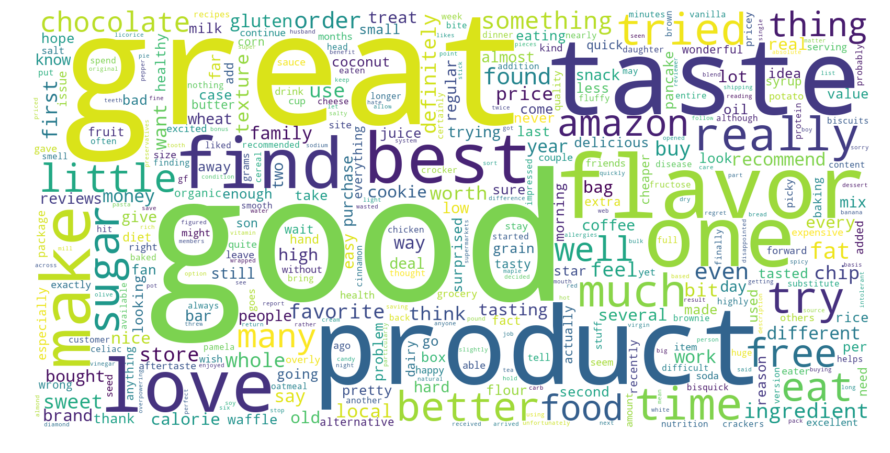

In [66]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s6) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


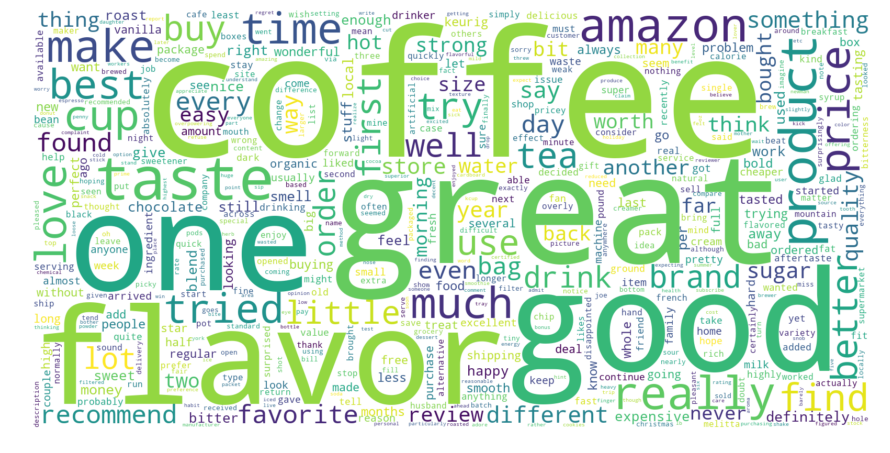

In [67]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s7) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

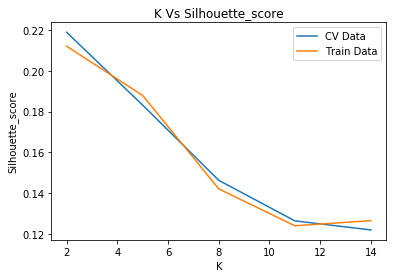

Best value of K is : 2


In [68]:
     
x =[]
y =[]
z =[]
w =[]
for i in range(2,15,3):
    clf = KMeans(n_clusters=i,n_jobs=-1)
    
    # fitting the model on crossvalidation train
    a = clf.fit(sent_vectors_tr)
    #p1 = clf.predict(X_tr_tfidv)
    acc2 = silhouette_score(sent_vectors_tr,clf.labels_)#np.log(clf.inertia_)
    clf = KMeans(n_clusters=i,n_jobs=-1)
    b = clf.fit(sent_vectors_cv)
    #clf.predict(X_cv_tfidv)
    # evaluate CV accuracy
    acc = silhouette_score(sent_vectors_cv,clf.labels_)#np.log(clf.inertia_)
   
    x.append(i)
    y.append(acc)
    z.append(acc2)



plt.plot(x, y, label='CV Data')
plt.plot(x, z, label='Train Data')
plt.legend()
plt.xlabel("K")
plt.ylabel("Silhouette_score")

plt.title("K Vs Silhouette_score")
plt.show()
best = y.index(max(y))
print("Best value of K is :",x[best])



In [69]:
clf = KMeans(n_clusters=2,n_jobs=-1)
clf.fit(sent_vectors_1)
silhouette_score(sent_vectors_1,clf.labels_)
#The best value is 1 and the worst value is -1. 

#Silhouette Score for AVG W2V using KMeans


0.21446252358990175

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

In [70]:
s0 = ""
s1 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in [g[0] for g in w2v_model.similar_by_vector(sent_vectors_1[c])]:
            
            if j in s0:
                pass
            else:
                s0+=j
                s0+=" "
        c+=1
    else:
        for j in [g[0] for g in w2v_model.similar_by_vector(sent_vectors_1[c])]:
            
            if j in s1:
                pass
            else:
                s1+=j
                s1+=" "
        c+=1
   

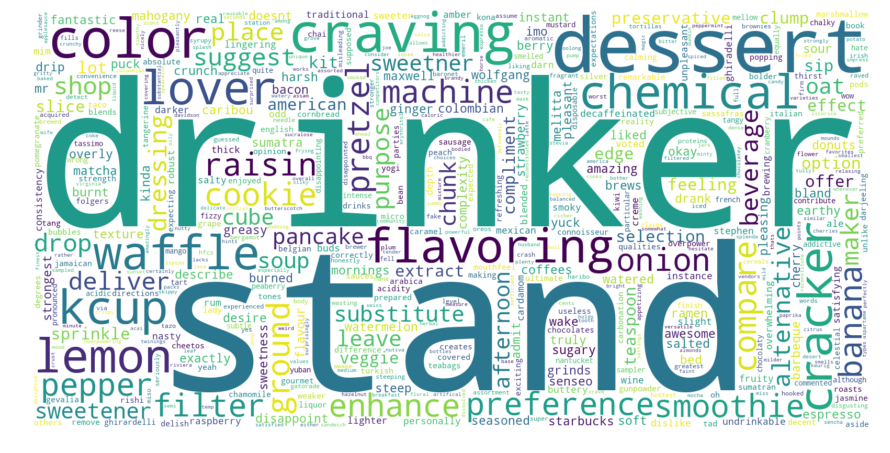

In [71]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


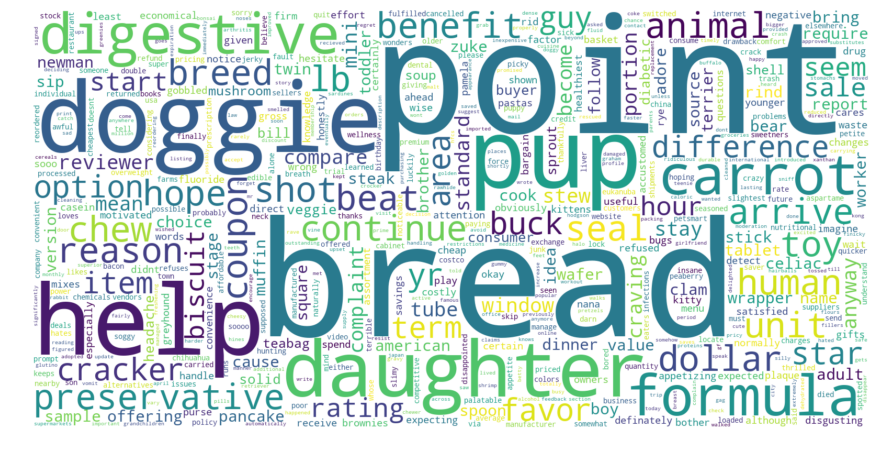

In [72]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

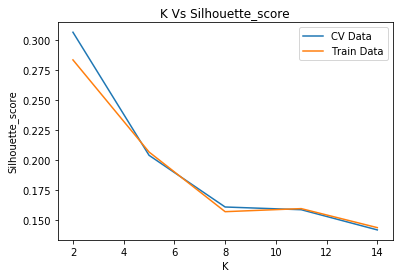

Best value of K is : 2


In [73]:
     
v =[]
x =[]
y =[]
z =[]
w =[]
for i in range(2,15,3):
    clf = KMeans(n_clusters=i,n_jobs=-1)
    
    # fitting the model on crossvalidation train
    a = clf.fit(tfidf_sent_vectors_tr)
    #p1 = clf.predict(X_tr_tfidv)
    acc2 = silhouette_score(tfidf_sent_vectors_tr,clf.labels_)#np.log(clf.inertia_)
    clf = KMeans(n_clusters=i,n_jobs=-1)
    b = clf.fit(tfidf_sent_vectors_cv)
    #clf.predict(X_cv_tfidv)
    # evaluate CV accuracy
    acc = silhouette_score(tfidf_sent_vectors_cv,clf.labels_)#np.log(clf.inertia_)
   
    x.append(i)
    y.append(acc)
    z.append(acc2)



plt.plot(x, y, label='CV Data')
plt.plot(x, z, label='Train Data')
plt.legend()
plt.xlabel("K")
plt.ylabel("Silhouette_score")

plt.title("K Vs Silhouette_score")
plt.show()
best = y.index(max(y))
print("Best value of K is :",x[best])



In [74]:
clf = KMeans(n_clusters=2,n_jobs=-1)
clf.fit(tfidf_sent_vectors_1)
silhouette_score(tfidf_sent_vectors_1,clf.labels_)
#The best value is 1 and the worst value is -1. 

#Silhouette Score for TFIDF W2V using KMeans


0.28514152069912113

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

In [75]:
s0 = ""
s1 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in [g[0] for g in w2v_model.similar_by_vector(tfidf_sent_vectors_1[c])]:
            
            if j in s0:
                pass
            else:
                s0+=j
                s0+=" "
        c+=1
    else:
        for j in [g[0] for g in w2v_model.similar_by_vector(tfidf_sent_vectors_1[c])]:
            
            if j in s1:
                pass
            else:
                s1+=j
                s1+=" "
        c+=1
   

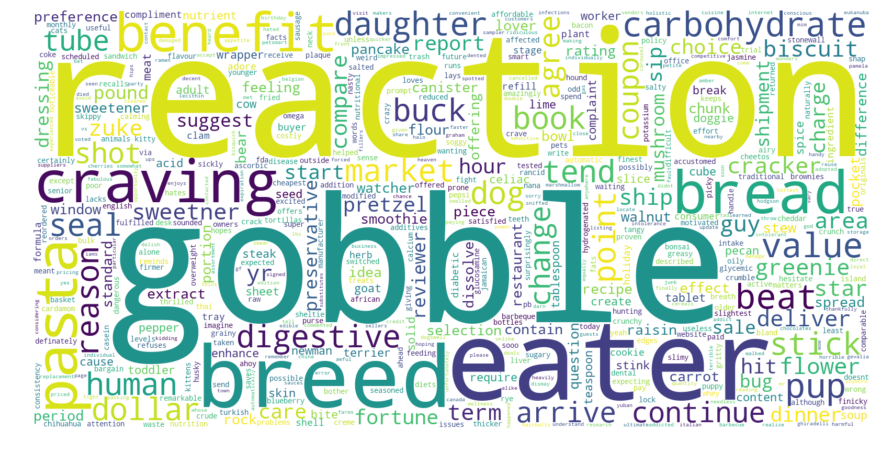

In [76]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


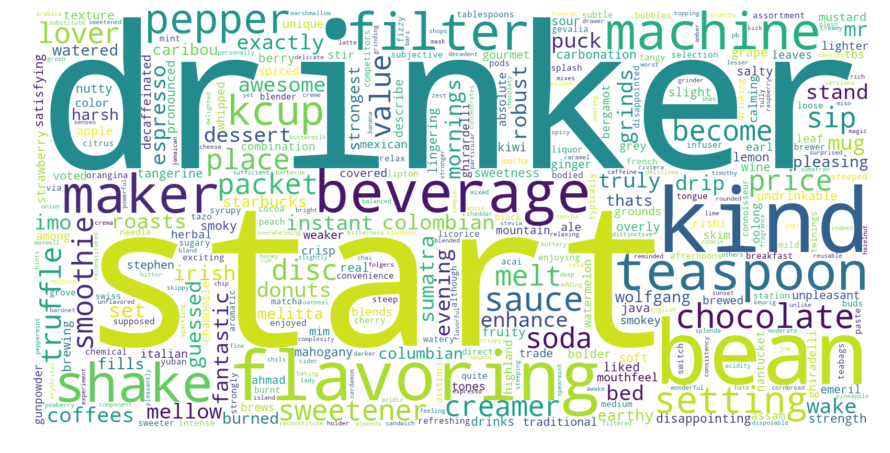

In [77]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

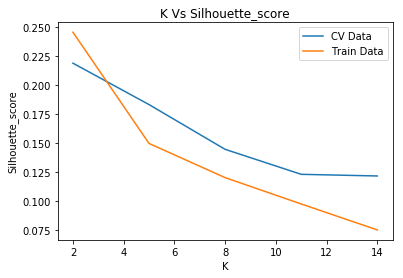

Best value of K is : 2


In [78]:
from sklearn.cluster import AgglomerativeClustering

v =[]
x =[]
y =[]
z =[]
w =[]
for i in range(2,15,3):
    clf = AgglomerativeClustering(n_clusters=i)
    
    # fitting the model on crossvalidation train
    a = clf.fit(sent_vectors_tr)
    #p1 = clf.predict(X_tr_bow)
    acc2 = silhouette_score(sent_vectors_tr,clf.labels_)#np.log(clf.inertia_)
    clf = KMeans(n_clusters=i,n_jobs=-1)
    b = clf.fit(sent_vectors_cv)
    #clf.predict(X_cv_bow)
    # evaluate CV accuracy
    acc = silhouette_score(sent_vectors_cv,clf.labels_)#np.log(clf.inertia_)
   
    x.append(i)
    y.append(acc)
    z.append(acc2)



plt.plot(x, y, label='CV Data')
plt.plot(x, z, label='Train Data')
plt.legend()
plt.xlabel("K")
plt.ylabel("Silhouette_score")

plt.title("K Vs Silhouette_score")
plt.show()
best = y.index(max(y))
print("Best value of K is :",x[best])

In [79]:

clf =AgglomerativeClustering(n_clusters=2)
clf.fit(sent_vectors_1)
silhouette_score(sent_vectors_1,clf.labels_)

#Silhouette Score for AVG W2V using Agglomerative Clustering

0.18812788214664544

### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

In [80]:
s0 = ""
s1 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in [g[0] for g in w2v_model.similar_by_vector(sent_vectors_1[c])]:
            
            if j in s0:
                pass
            else:
                s0+=j
                s0+=" "
        c+=1
    else:
        for j in [g[0] for g in w2v_model.similar_by_vector(sent_vectors_1[c])]:
            
            if j in s1:
                pass
            else:
                s1+=j
                s1+=" "
        c+=1
   

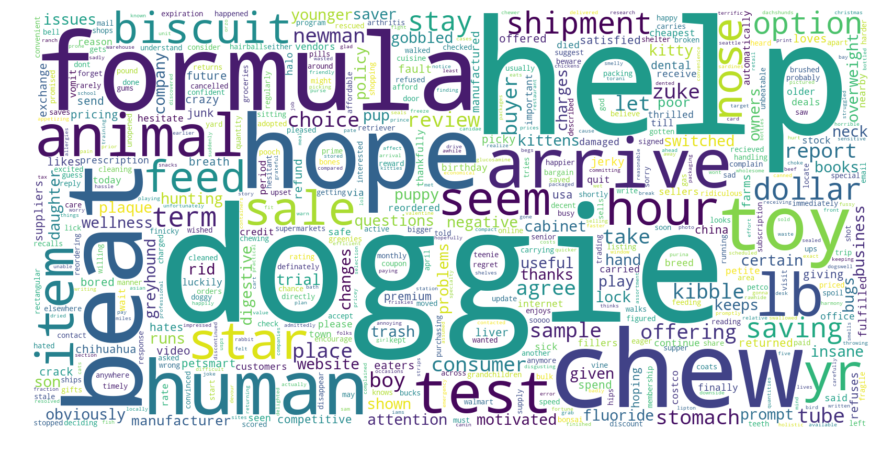

In [81]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


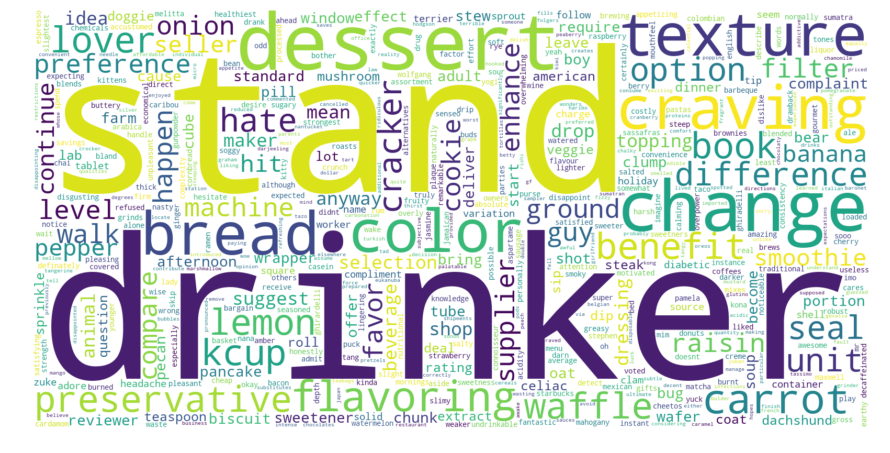

In [82]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

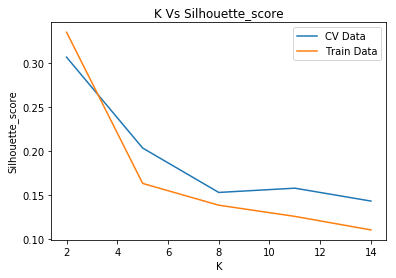

Best value of K is : 2


In [83]:
from sklearn.cluster import AgglomerativeClustering

v =[]
x =[]
y =[]
z =[]
w =[]
for i in range(2,15,3):
    clf = AgglomerativeClustering(n_clusters=i)
    
    # fitting the model on crossvalidation train
    a = clf.fit(tfidf_sent_vectors_tr)
    #p1 = clf.predict(X_tr_bow)
    acc2 = silhouette_score(tfidf_sent_vectors_tr,clf.labels_)#np.log(clf.inertia_)
    clf = KMeans(n_clusters=i,n_jobs=-1)
    b = clf.fit(tfidf_sent_vectors_cv)
    #clf.predict(X_cv_bow)
    # evaluate CV accuracy
    acc = silhouette_score(tfidf_sent_vectors_cv,clf.labels_)#np.log(clf.inertia_)
   
    x.append(i)
    y.append(acc)
    z.append(acc2)



plt.plot(x, y, label='CV Data')
plt.plot(x, z, label='Train Data')
plt.legend()
plt.xlabel("K")
plt.ylabel("Silhouette_score")

plt.title("K Vs Silhouette_score")
plt.show()
best = y.index(max(y))
print("Best value of K is :",x[best])

In [84]:

clf =AgglomerativeClustering(n_clusters=2)
clf.fit(tfidf_sent_vectors_1)
silhouette_score(tfidf_sent_vectors_1,clf.labels_)

#silhouette Score for TFIDF W2V using Agglomerative Clustering

0.27902651074175483

### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

In [85]:
s0 = ""
s1 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in [g[0] for g in w2v_model.similar_by_vector(tfidf_sent_vectors_1[c])]:
            
            if j in s0:
                pass
            else:
                s0+=j
                s0+=" "
        c+=1
    else:
        for j in [g[0] for g in w2v_model.similar_by_vector(tfidf_sent_vectors_1[c])]:
            
            if j in s1:
                pass
            else:
                s1+=j
                s1+=" "
        c+=1
   

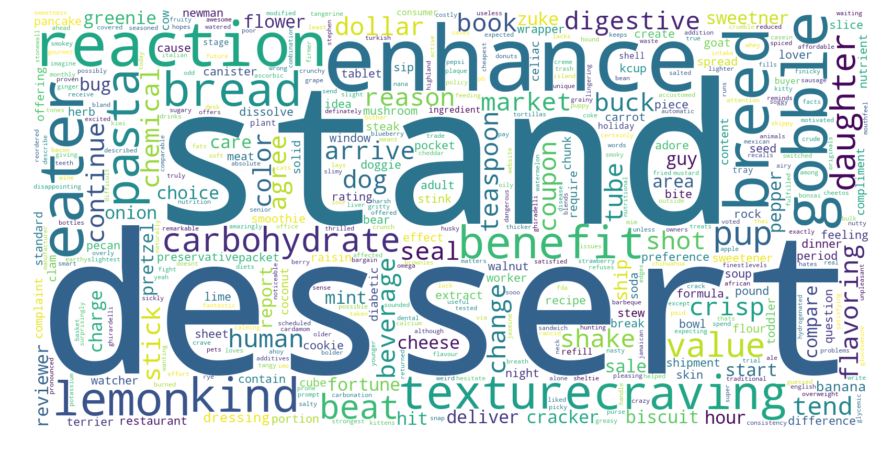

In [86]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


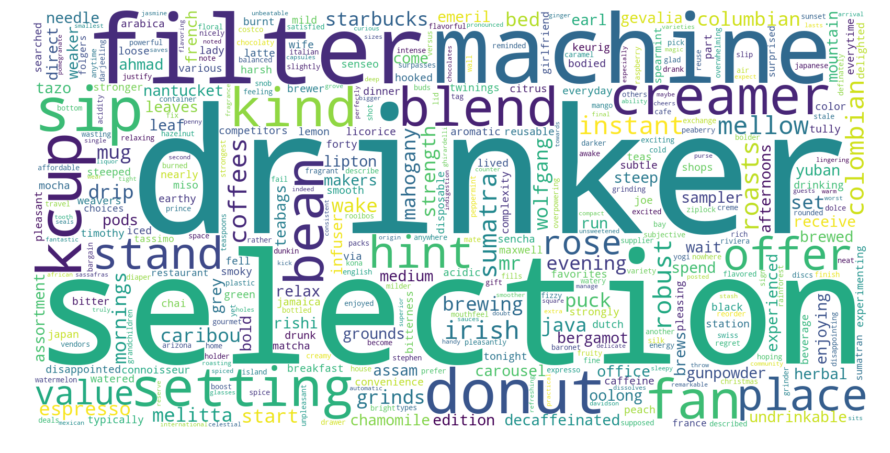

In [87]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


## [5.3] DBSCAN Clustering


### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

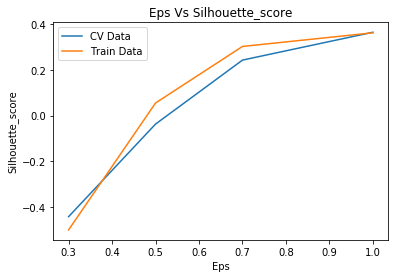

Best value of Eps is : 1


In [97]:

from sklearn.cluster import DBSCAN


x =[]
y =[]
z =[]
w =[]
for i in [.3,.5,.7,1]:
    
    clf = DBSCAN(eps=i,n_jobs=-1)
    
    # fitting the model on crossvalidation train
    clf.fit(sent_vectors_tr)
    #p1 = clf.predict(X_tr_bow)
    acc2 = silhouette_score(sent_vectors_tr,clf.labels_)#np.log(clf.inertia_)
    clf = DBSCAN(eps=i,n_jobs=-1)
    clf.fit(sent_vectors_cv)
    #clf.predict(X_cv_bow)
    # evaluate CV accuracy
    acc = silhouette_score(sent_vectors_cv,clf.labels_)#np.log(clf.inertia_)
   
    x.append(i)
    y.append(acc)
    z.append(acc2)



plt.plot(x, y, label='CV Data')
plt.plot(x, z, label='Train Data')
plt.legend()
plt.xlabel("Eps")
plt.ylabel("Silhouette_score")

plt.title("Eps Vs Silhouette_score")
plt.show()
best = y.index(max(y))
print("Best value of Eps is :",x[best])

In [93]:
clf =DBSCAN(eps=1,n_jobs=-1)
clf.fit(sent_vectors_1)
silhouette_score(sent_vectors_1,clf.labels_)


#Silhouette Score for AVG-W2V using DBSCAN Clustering

0.3651210038975706

In [98]:
d=[]
for s in clf.labels_:
    if s not in d:
        d.append(s)
print(d)

[0, -1, 1]


### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

In [99]:
s0 = ""
s1 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in [g[0] for g in w2v_model.similar_by_vector(sent_vectors_1[c])]:
            
            if j in s0:
                pass
            else:
                s0+=j
                s0+=" "
        c+=1
    else:
        for j in [g[0] for g in w2v_model.similar_by_vector(sent_vectors_1[c])]:
            
            if j in s1:
                pass
            else:
                s1+=j
                s1+=" "
        c+=1
   

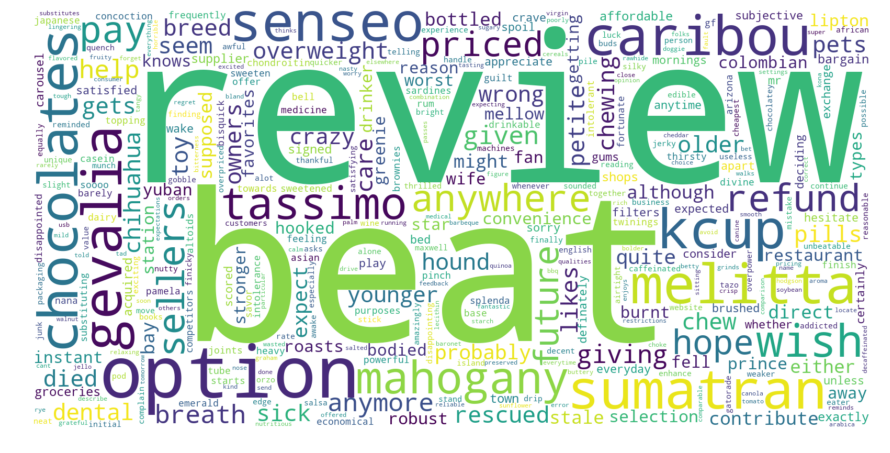

In [100]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


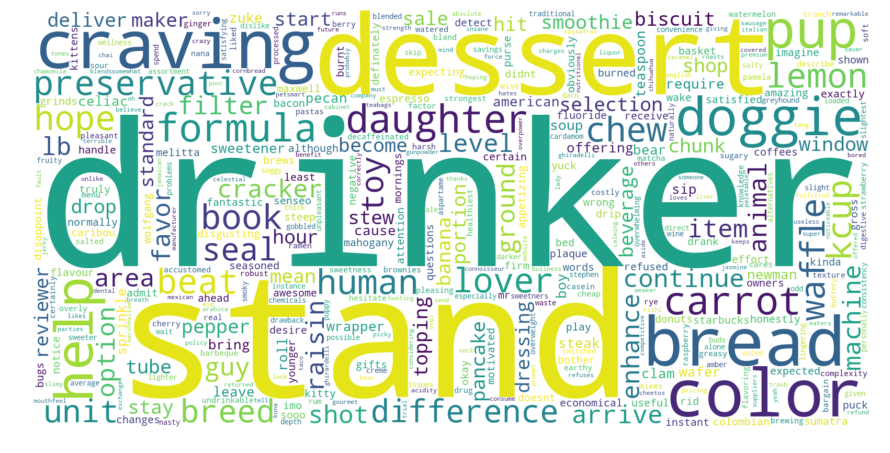

In [101]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

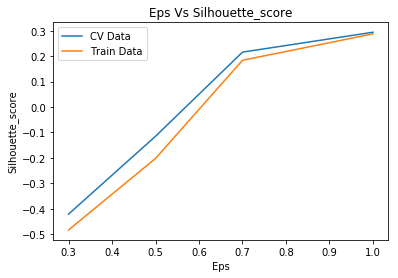

Best value of Eps is : 1


In [104]:

from sklearn.cluster import DBSCAN


x =[]
y =[]
z =[]
w =[]
for i in [.3,.5,.7,1]:
    v=[]
    clf = DBSCAN(eps=i,n_jobs=-1)
    
    # fitting the model on crossvalidation train
    clf.fit(tfidf_sent_vectors_tr)
    #p1 = clf.predict(X_tr_bow)
    acc2 = silhouette_score(tfidf_sent_vectors_tr,clf.labels_)#np.log(clf.inertia_)
    clf = DBSCAN(eps=i,n_jobs=-1)
    clf.fit(tfidf_sent_vectors_cv)
    #clf.predict(X_cv_bow)
    # evaluate CV accuracy
    acc = silhouette_score(tfidf_sent_vectors_cv,clf.labels_)#np.log(clf.inertia_)
   
    x.append(i)
    y.append(acc)
    z.append(acc2)



plt.plot(x, y, label='CV Data')
plt.plot(x, z, label='Train Data')
plt.legend()
plt.xlabel("Eps")
plt.ylabel("Silhouette_score")

plt.title("Eps Vs Silhouette_score")
plt.show()
best = y.index(max(y))
print("Best value of Eps is :",x[best])

In [105]:
clf =DBSCAN(eps=1,n_jobs=-1)
clf.fit(tfidf_sent_vectors_1)
silhouette_score(tfidf_sent_vectors_1,clf.labels_)


#silhouette score for TFIDF W2V using DBSCAN Clustering

0.2895547521338979

In [106]:
d=[]
for s in clf.labels_:
    if s not in d:
        d.append(s)
print(d)

[0, -1, 1]


### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

In [107]:
s0 = ""
s1 = ""
c=0
for i in clf.labels_:
    if i == 0 :
        for j in [g[0] for g in w2v_model.similar_by_vector(tfidf_sent_vectors_1[c])]:
            
            if j in s0:
                pass
            else:
                s0+=j
                s0+=" "
        c+=1
    else:
        for j in [g[0] for g in w2v_model.similar_by_vector(tfidf_sent_vectors_1[c])]:
            
            if j in s1:
                pass
            else:
                s1+=j
                s1+=" "
        c+=1
   

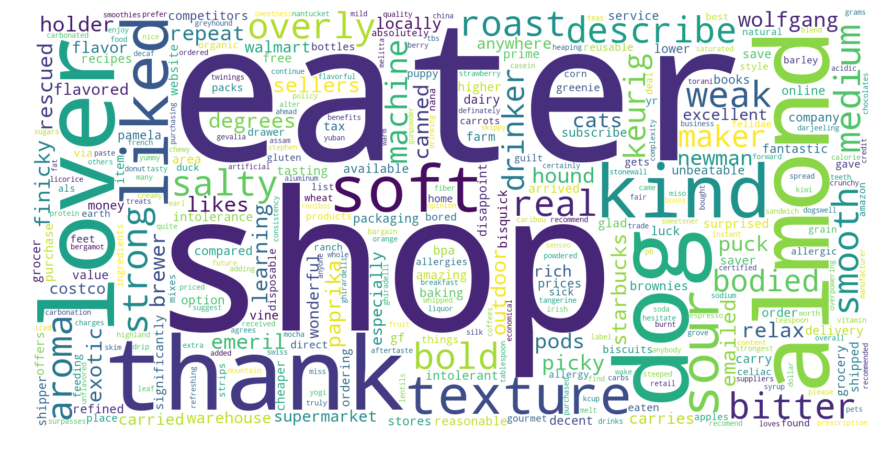

In [108]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s1) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


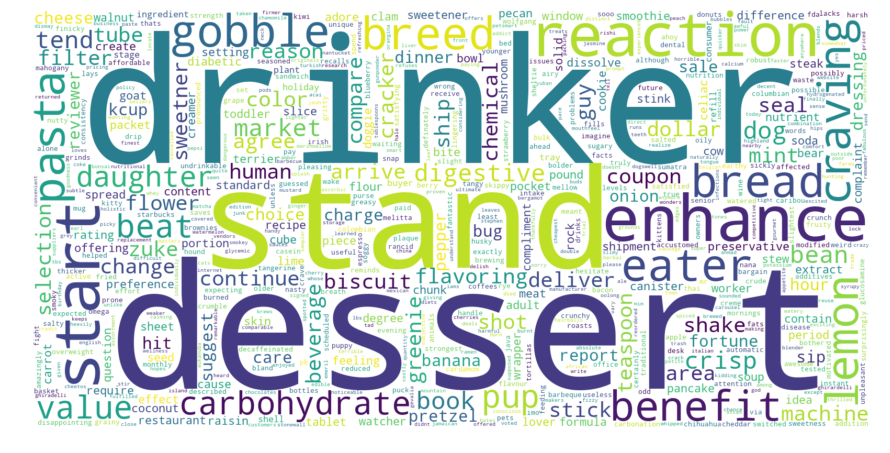

In [109]:
# show only 10000 words in the wordcloud . 
wordcloud = WordCloud(width = 1600, height = 800, max_words=10000,
                background_color ='white', 
                min_font_size = 10).generate(s0) 
  
# plot the WordCloud image  
plt.figure(figsize=(15,15)) 
plt.imshow(wordcloud, interpolation="bilinear") 
plt.axis("off") 
plt.margins(x=0, y=0) 
plt.show() 


# [6] Conclusions

In [117]:
from prettytable import PrettyTable
x = PrettyTable()

x.field_names = ["Vectoriser", "Model", "Hyperparameter ", "Silhouette score"]

x.add_row(["BOW","K Means Clustering","n_clusters=2",0.3139])
x.add_row(["TFIDF","K Means Clustering","n_clusters=8",0.0130])
x.add_row(["W2V","K Means Clustering","n_clusters=2",0.2145])
x.add_row(["TFIDF-W2V","K Means Clustering","n_clusters=2",0.2851])
x.add_row(["W2V","Agglomerative Clustering ","n_clusters=2",0.1881])
x.add_row(["TFIDF-W2V","Agglomerative Clustering ","n_clusters=2",0.2790])
x.add_row(["W2V","DBSCAN Clustering","Eps=1",0.3651])
x.add_row(["TFIDF-W2V","DBSCAN Clustering","Eps=1",0.2895])
print(x)

+------------+---------------------------+-----------------+------------------+
| Vectoriser |           Model           | Hyperparameter  | Silhouette score |
+------------+---------------------------+-----------------+------------------+
|    BOW     |     K Means Clustering    |   n_clusters=2  |      0.3139      |
|   TFIDF    |     K Means Clustering    |   n_clusters=8  |      0.013       |
|    W2V     |     K Means Clustering    |   n_clusters=2  |      0.2145      |
| TFIDF-W2V  |     K Means Clustering    |   n_clusters=2  |      0.2851      |
|    W2V     | Agglomerative Clustering  |   n_clusters=2  |      0.1881      |
| TFIDF-W2V  | Agglomerative Clustering  |   n_clusters=2  |      0.279       |
|    W2V     |     DBSCAN Clustering     |      Eps=1      |      0.3651      |
| TFIDF-W2V  |     DBSCAN Clustering     |      Eps=1      |      0.2895      |
+------------+---------------------------+-----------------+------------------+


In [2]:
str = "abcdeda"

print(str)
for i in str:
    if i in str.replace(i,""):
        print(i)

abcdeda


In [3]:
from collections import Counter
c = Counter('abcdeda') 

In [4]:
print(c)

Counter({'a': 3, 'l': 2, 'g': 1, 'h': 1, 'd': 1})


In [ ]:
Program 1 :
    
    Output first recurring character from given string. 
        Example : → abcade  → a 
        Example : → abcdeda → d
    
from collections import Counter

uni = set("abcdeda")
str = "abcdeda" 
l=[]
c = ""
dif=len(str)
for i in uni:
    if c[i]>1:
        dif2 = str[::-1].index(i)) - str.index(i)
        if dif2<dif:
            dif = dif2
            c=i
print(c)      
        
        
        
        
Program 2 :
    
       Print sum of all unique Prime Numbers from a given array.
            Example :  → [ 2, 4, 7, 3, 5, 12, 3 ]  → 17
            
l =[2, 4, 7, 3, 5, 12, 3]
import sympy 
l2=[]
for i in l:
    if sympy.isprime(i) and i not in l2:
        l2.append(i)
print(sum(l2))
            
            
            
            
Program 3 : 
    
        Find HCF of n given numbers.
        
s =sorted([4,8,12])

a= s[0]
b=s[1]
def h(a,b):
    if b=0:
        return a
    else:
        return (h(b,a%b))
f =len(s)
c=2
while f >2:
    ans = h(h(a,b),s[c])
    c++
    f--
        
        
        
        
        
Nothing yet..

hello
   
        


We want to highlight important phrases from  paragra
        
  
